In [2]:
# GPU status
!nvidia-smi

#get data and code
!git clone https://github.com/geon0325/LightGCNpp.git
%cd LightGCNpp
!ls -la

Tue Sep 30 03:33:27 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   54C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
import sys
sys.path.append("/content/LightGCNpp/code")

In [4]:
from pathlib import Path
import re

mp = Path("/content/LightGCNpp/code/model.py")
src = mp.read_text()

# 若未导入 numpy，则加上（安全幂等）
if "import numpy as np" not in src:
    src = src.replace("from torch import nn", "from torch import nn\nimport numpy as np")

# 在 LightGCN 类中添加 dump_embeddings 方法
if "def dump_embeddings(self, epoch" not in src:
    insert_anchor = "class LightGCN(BasicModel):"
    pos = src.find(insert_anchor)
    assert pos != -1, "Cannot locate LightGCN class."
    after_init_pos = src.find("def __init__", pos)
    after_init_end = src.find("\n    def ", after_init_pos+1)
    if after_init_end == -1:
        after_init_end = src.find("\nclass ", pos+1)
        if after_init_end == -1:
            after_init_end = len(src)

    method_block = r'''
    def dump_embeddings(self, epoch:int, out_dir:str="."):
        """
        Save layer-wise user/item embeddings and final fused embeddings for a given epoch.
        Requires being called in eval() mode (no_grad).
        Files:
          {out_dir}/user_emb_layer{k}_epoch{epoch}.npy
          {out_dir}/item_emb_layer{k}_epoch{epoch}.npy
          {out_dir}/user_emb_final_epoch{epoch}.npy
          {out_dir}/item_emb_final_epoch{epoch}.npy
        """
        self.eval()
        with torch.no_grad():
            users, items, _users, _items = self.computer()
            num_layers = _users.shape[1]  # L+1 (including layer0)
            for k in range(num_layers):
                u = _users[:, k, :].detach().cpu().numpy()
                i = _items[:, k, :].detach().cpu().numpy()
                np.save(f"{out_dir}/user_emb_layer{k}_epoch{epoch}.npy", u)
                np.save(f"{out_dir}/item_emb_layer{k}_epoch{epoch}.npy", i)
            u_final = users.detach().cpu().numpy()
            i_final = items.detach().cpu().numpy()
            np.save(f"{out_dir}/user_emb_final_epoch{epoch}.npy", u_final)
            np.save(f"{out_dir}/item_emb_final_epoch{epoch}.npy", i_final)
            print(f"✅ dumped embeddings for epoch {epoch} to {out_dir}")
'''
    src = src[:after_init_end] + method_block + src[after_init_end:]

mp.write_text(src)
print("Patched model.py: added dump_embeddings(epoch, out_dir).")

Patched model.py: added dump_embeddings(epoch, out_dir).


In [5]:
import re
from pathlib import Path

p = Path("/content/LightGCNpp/code/model.py")
s = p.read_text()

# 替换 import world_gaudi 成 try/except
s = re.sub(r'^\s*import world_gaudi.*$',
           'try:\n    import world_gaudi  # optional Gaudi support\nexcept Exception:\n    world_gaudi = None',
           s, flags=re.M)

# 替换 .to(world_gaudi.device)
s = s.replace(
    ".to(world_gaudi.device)",
    ".to(self.embedding_user.weight.device if (world_gaudi is None) else world_gaudi.device)"
)

p.write_text(s)
print("✅ Patched model.py to make Gaudi optional (safe).")

✅ Patched model.py to make Gaudi optional (safe).


In [6]:
from pathlib import Path

p = Path("/content/LightGCNpp/code/model.py")
s = p.read_text()

# 找一个锚点：头部 imports 通常到 'from torch import nn' 结束
anchor = "from torch import nn"
pos = s.find(anchor)
if pos == -1:
    raise RuntimeError("Cannot locate 'from torch import nn' in model.py; aborting to avoid damage.")

# 找到这一行的行尾位置
line_end = s.find("\n", pos)
if line_end == -1:
    line_end = pos + len(anchor)

# 构造干净的头部（注意顺序与缩进）
clean_header = (
    "import world\n"
    "try:\n"
    "    import world_gaudi  # optional Gaudi support\n"
    "except Exception:\n"
    "    world_gaudi = None\n"
    "import torch\n"
    "from dataloader import BasicDataset\n"
    "from torch import nn\n"
    "import numpy as np\n"
)

# 用干净头部替换原头部
new_src = clean_header + s[line_end+1:]
p.write_text(new_src)

print("✅ Cleaned model.py header (world_gaudi optional import), kept the rest intact.")

✅ Cleaned model.py header (world_gaudi optional import), kept the rest intact.


In [7]:
from pathlib import Path
import re

pp = Path("/content/LightGCNpp/code/Procedure.py")
src = pp.read_text()

# 1) 备份
pp.with_suffix(".py.bak").write_text(src)

# 2) 新的 BPR_train_original 函数（包含每个 epoch 结束保存 embeddings）
new_func = r'''
def BPR_train_original(dataset, recommend_model, loss_class, epoch, neg_k=1, w=None):
    """
    Train one epoch with BPR and (optionally) dump embeddings at epoch end.
    """
    Recmodel = recommend_model
    Recmodel.train()
    bpr: utils.BPRLoss = loss_class

    with timer(name="Sample"):
        S = utils.UniformSample_original(dataset)

    users = torch.Tensor(S[:, 0]).long()
    posItems = torch.Tensor(S[:, 1]).long()
    negItems = torch.Tensor(S[:, 2]).long()

    users = users.to(world.device)
    posItems = posItems.to(world.device)
    negItems = negItems.to(world.device)
    users, posItems, negItems = utils.shuffle(users, posItems, negItems)

    total_batch = len(users) // world.config['bpr_batch_size'] + 1
    aver_loss = 0.0

    for batch_i, (batch_users, batch_pos, batch_neg) in enumerate(
        utils.minibatch(users, posItems, negItems, batch_size=world.config['bpr_batch_size'])
    ):
        cri = bpr.stageOne(batch_users, batch_pos, batch_neg)
        aver_loss += cri
        if world.tensorboard:
            w.add_scalar(
                f'BPRLoss/BPR',
                cri,
                epoch * int(len(users) / world.config['bpr_batch_size']) + batch_i
            )

    aver_loss = aver_loss / total_batch
    time_info = timer.dict()
    timer.zero()

    # === dump embeddings at end of this epoch (before evaluation) ===
    try:
        if getattr(world, "config", {}).get("save_layer_emb", 0) == 1 and hasattr(Recmodel, "dump_embeddings"):
            import os
            Recmodel.eval()
            with torch.no_grad():
                os.makedirs("embeds", exist_ok=True)
                # 这里用 epoch+1 作为当前 epoch 序号（从 1 开始）
                Recmodel.dump_embeddings(epoch=epoch+1, out_dir="embeds")
            Recmodel.train()
            print(f"[dump] saved embeddings for epoch {epoch+1} to ./embeds")
    except Exception as e:
        print(f"[dump][ERROR] failed to dump embeddings at epoch {epoch+1}: {e}")

    return f"loss{aver_loss:.3f}-{time_info}"
'''.lstrip("\n")

# 3) 用正则找到旧的函数体并替换（从 def BPR_train_original 开始到下一个 def 或文件结尾）
pat = re.compile(r'^\s*def\s+BPR_train_original\s*\(.*?(?=^\s*def\s+|\Z)', re.S | re.M)
if not pat.search(src):
    raise RuntimeError("没找到 BPR_train_original 函数；请确认文件内容。")
new_src = pat.sub(new_func, src, count=1)

pp.write_text(new_src)
print("✅ Replaced BPR_train_original() with a clean version that dumps embeddings each epoch.")

✅ Replaced BPR_train_original() with a clean version that dumps embeddings each epoch.


In [8]:
!pip install tensorboardX

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 3.0 MB/s eta 0:00:00


In [9]:
from pathlib import Path
mp = Path("/content/LightGCNpp/code/main.py")
src = mp.read_text()

if "atexit.register(_dump_on_exit)" not in src:
    patch = r"""
# === dump embeddings on program exit (atexit) ===
try:
    import atexit, os, torch
    from register import Recmodel
    from world import config as _cfg
    def _dump_on_exit():
        try:
            if hasattr(Recmodel, "dump_embeddings"):
                os.makedirs("embeds", exist_ok=True)
                Recmodel.eval()
                with torch.no_grad():
                    final_epoch = int(_cfg.get("epochs", 0))
                    Recmodel.dump_embeddings(epoch=final_epoch if final_epoch>0 else 0, out_dir="embeds")
                Recmodel.train()
                print("[dump] atexit: final embeddings saved to ./embeds")
            else:
                print("[dump][WARN] atexit: Recmodel has no dump_embeddings")
        except Exception as e:
            print(f"[dump][ERROR] atexit: {e}")
    atexit.register(_dump_on_exit)
except Exception as _e:
    print(f"[dump][WARN] failed to register atexit dumper: {_e}")
"""
    # 追加到文件末尾最省事
    mp.write_text(src.rstrip() + "\n" + patch)
    print("✅ Patched main.py with atexit dumper.")
else:
    print("⏩ atexit dumper already present.")

✅ Patched main.py with atexit dumper.


In [10]:
%cd /content/LightGCNpp/code
!rm -f embs/*.pkl
!python main.py \
  --dataset amazon-book --model lgn \
  --recdim 64 --layer 3 --lr 0.001 --decay 1e-4 \
  --epochs 30 --topks "[20,50]" \
  --gpu 0 --tensorboard 0 \
  --save_layer_emb 1 --multicore 8

/content/LightGCNpp/code
Cpp extension not loaded
>>SEED: 2020
loading [../data/amazon-book]
1862954 interactions for training
238528 interactions for validation
603378 interactions for testing
amazon-book Sparsity : 0.000560936148666567
amazon-book is ready to go
===========config================
{'A_n_fold': 100,
 'A_split': False,
 'alpha': 0.6,
 'beta': -0.1,
 'bigdata': False,
 'bpr_batch_size': 2048,
 'decay': 0.0001,
 'dropout': 0,
 'gamma': 0.2,
 'keep_prob': 0.6,
 'latent_dim_rec': 64,
 'lightGCN_n_layers': 3,
 'lr': 0.001,
 'multicore': 8,
 'pretrain': 0,
 'save_layer_emb': 1,
 'test_u_batch_size': 100}
cores for test: 4
comment: lgn
tensorboard: 0
LOAD: 0
Weight path: ./checkpoints
Test Topks: [20, 50]
using bpr loss
===========end===================
use NORMAL distribution initilizer
loading adjacency matrix
generating adjacency matrix
/content/LightGCNpp/code/dataloader.py:377: RuntimeWarning: divide by zero encountered in power
  rowsum_left = np.array(adj_mat.sum(axis=1)

/content/LightGCNpp/code/embeds


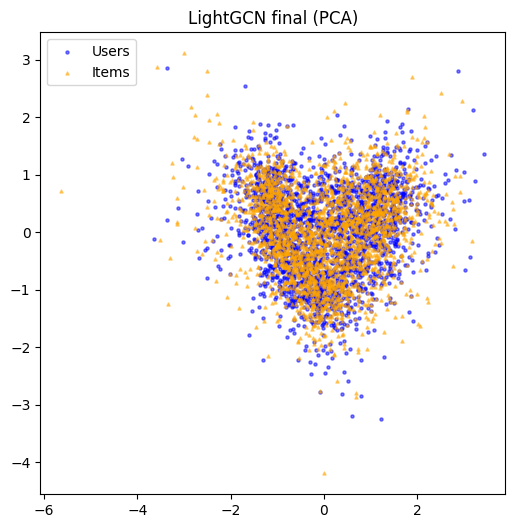

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


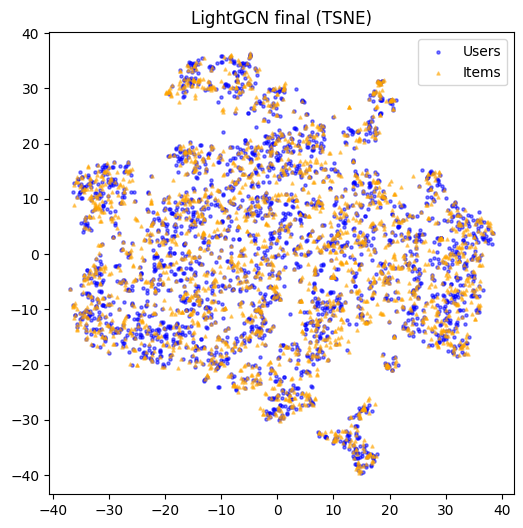

In [15]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

def plot_embeddings(user_file, item_file, method="pca", title="", sample_size=5000):
    u = np.load(user_file)
    i = np.load(item_file)
    X = np.vstack([u, i])
    labels = np.array([0]*len(u) + [1]*len(i))  # 0=user, 1=item

    # if too many points, do the sampling first
    if len(X) > sample_size:
        idx = np.random.choice(len(X), sample_size, replace=False)
        X = X[idx]
        labels = labels[idx]

    if method == "pca":
        Z = PCA(n_components=2).fit_transform(X)
    else:  # t-SNE
        X_reduced = PCA(n_components=20).fit_transform(X)   # dimension compress to 20
        Z = TSNE(n_components=2, perplexity=30, init="pca",
                 n_iter=500, random_state=42).fit_transform(X_reduced)

    # plot
    plt.figure(figsize=(6,6))
    plt.scatter(Z[labels==0,0], Z[labels==0,1], s=5, c="blue", alpha=0.5, label="Users")
    plt.scatter(Z[labels==1,0], Z[labels==1,1], s=5, c="orange", alpha=0.5, marker="^", label="Items")
    plt.title(title + f" ({method.upper()})")
    plt.legend()
    plt.show()

%cd /content/LightGCNpp/code/embeds
#plot_embeddings("item_emb_final_epoch37.npy",  method="pca", title="LightGCN final")
plot_embeddings("user_emb_final_epoch1.npy", "user_emb_final_epoch1.npy", method="pca", title="LightGCN final")
plot_embeddings("user_emb_final_epoch1.npy", "user_emb_final_epoch1.npy", method="tsne", title="LightGCN final")

/content/LightGCNpp/code/embeds
=== Epoch 1 ===


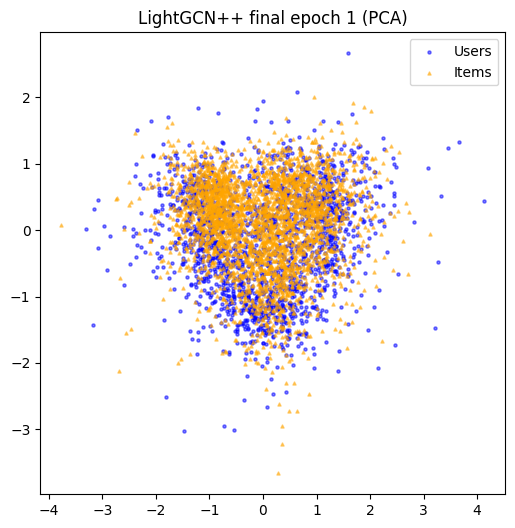

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


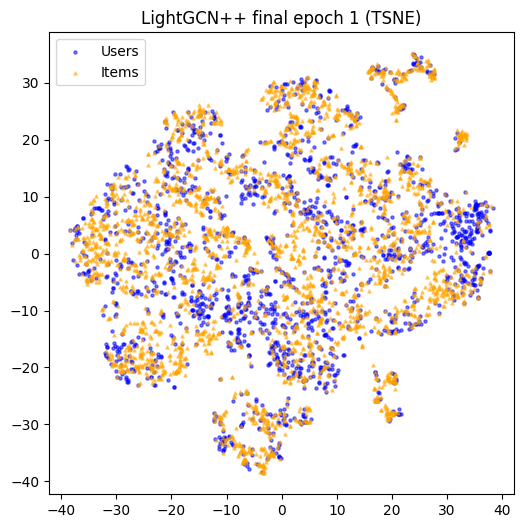

=== Epoch 2 ===


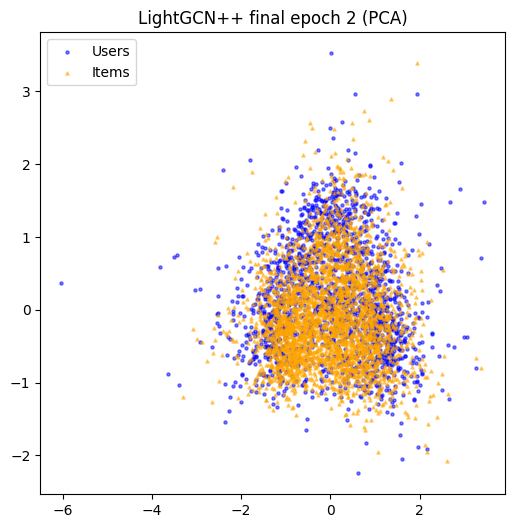

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


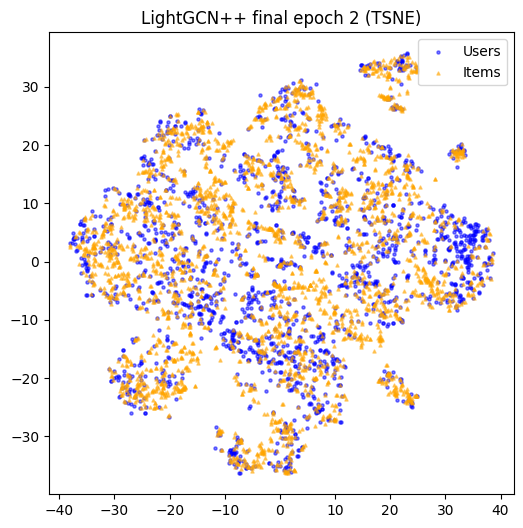

=== Epoch 3 ===


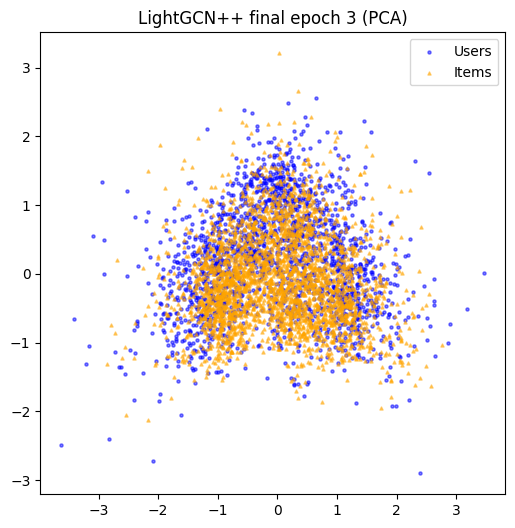

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


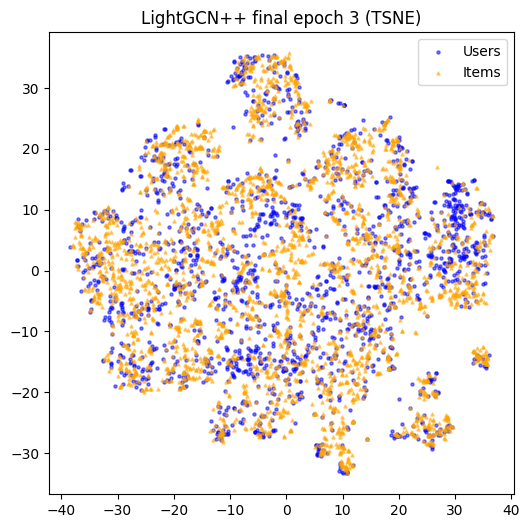

=== Epoch 4 ===


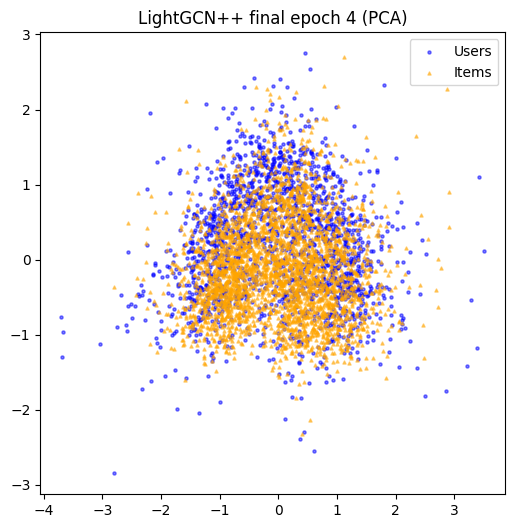

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


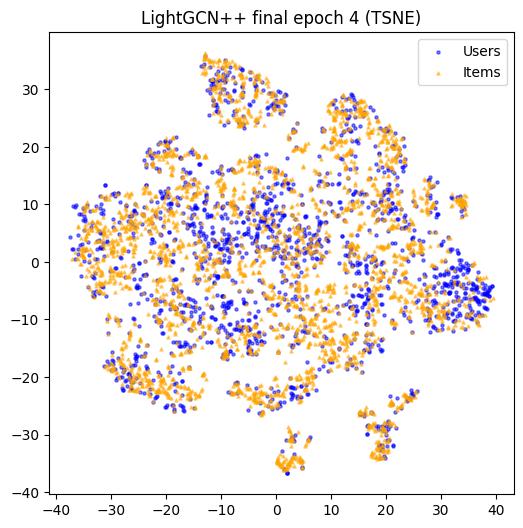

=== Epoch 5 ===


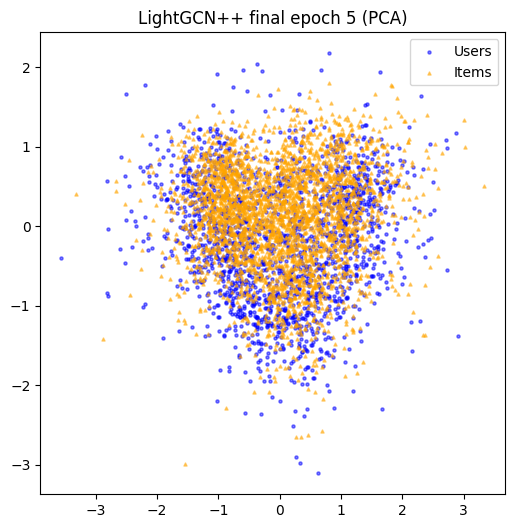

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


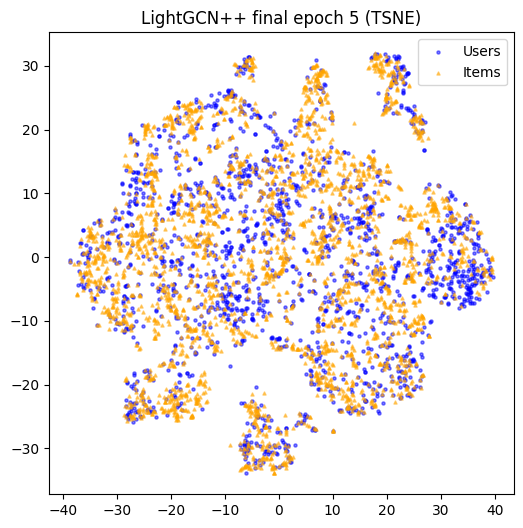

=== Epoch 6 ===


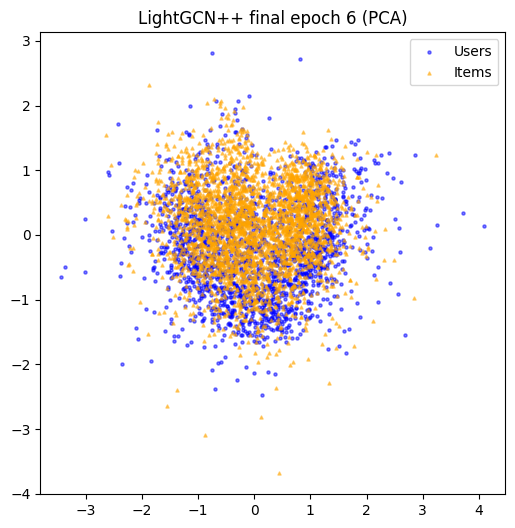

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


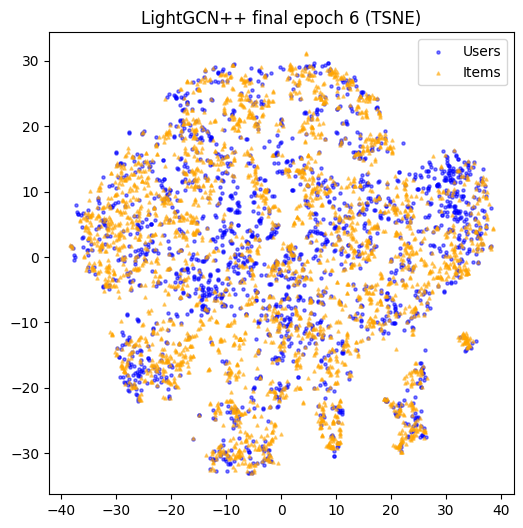

=== Epoch 7 ===


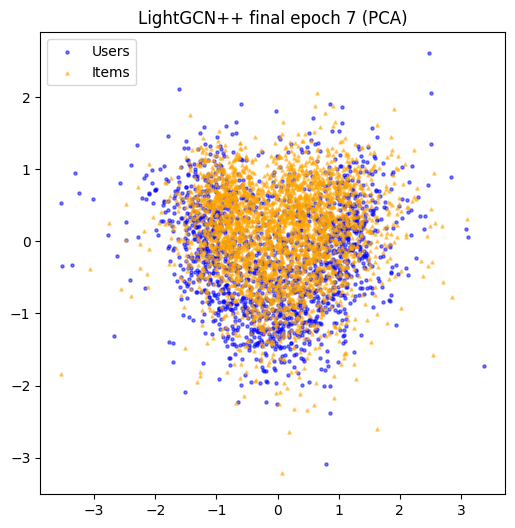

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


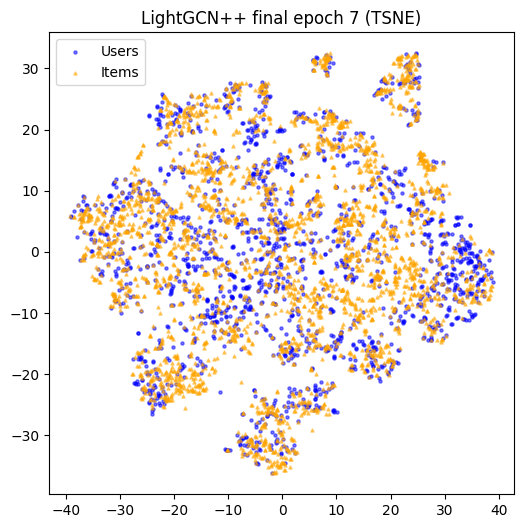

=== Epoch 8 ===


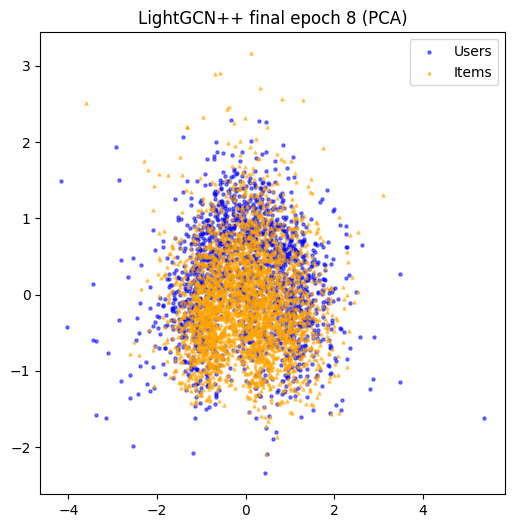

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


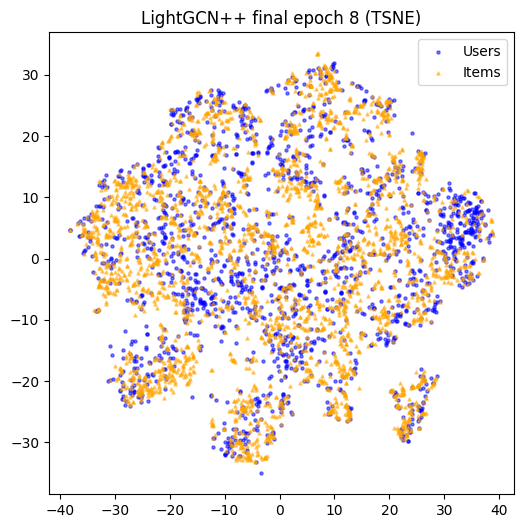

=== Epoch 9 ===


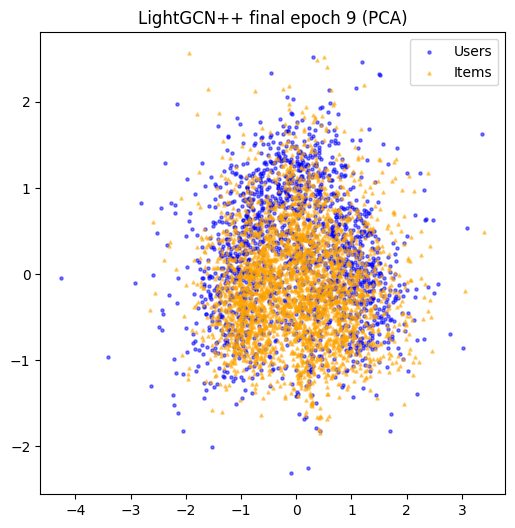

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


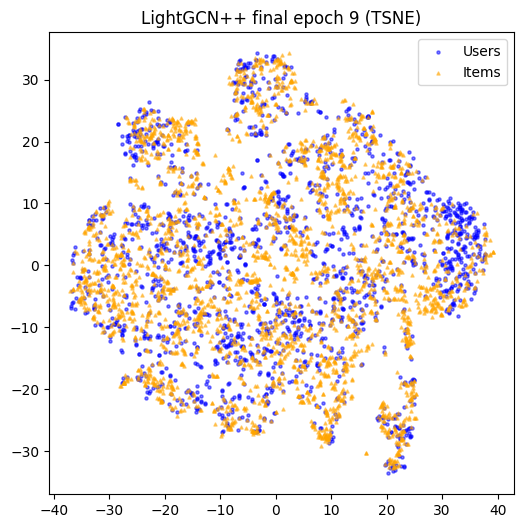

=== Epoch 10 ===


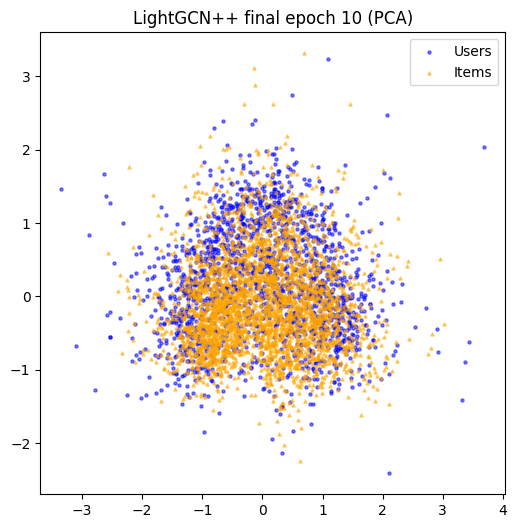

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


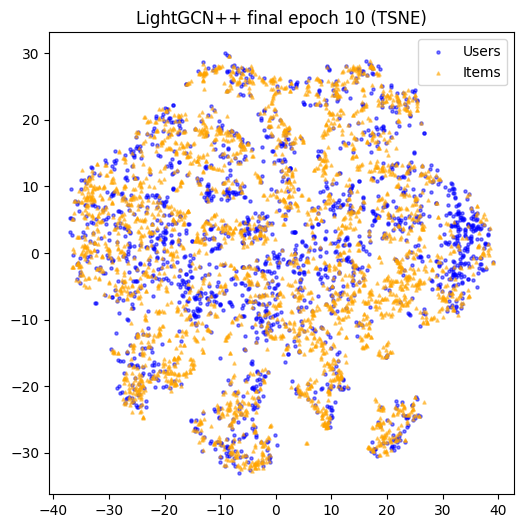

=== Epoch 11 ===


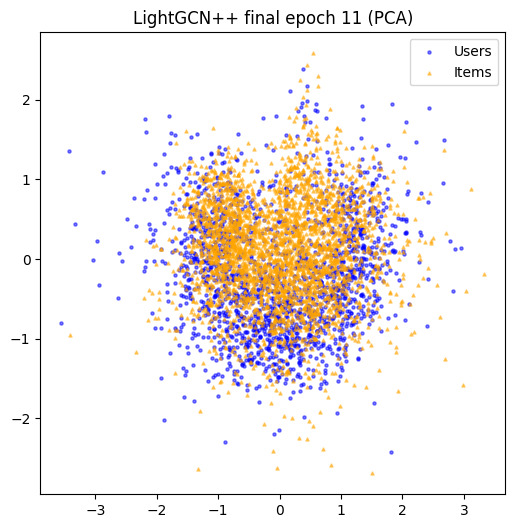

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


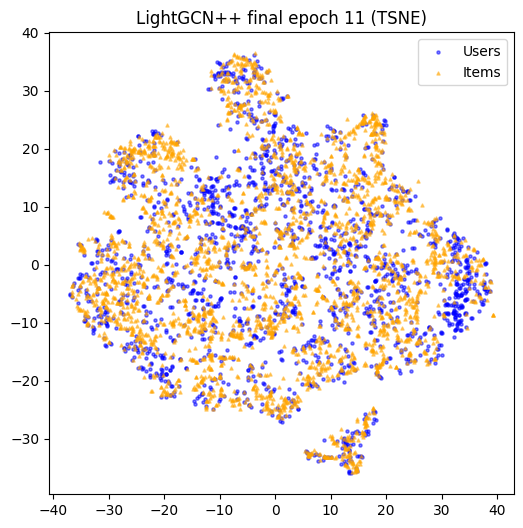

=== Epoch 12 ===


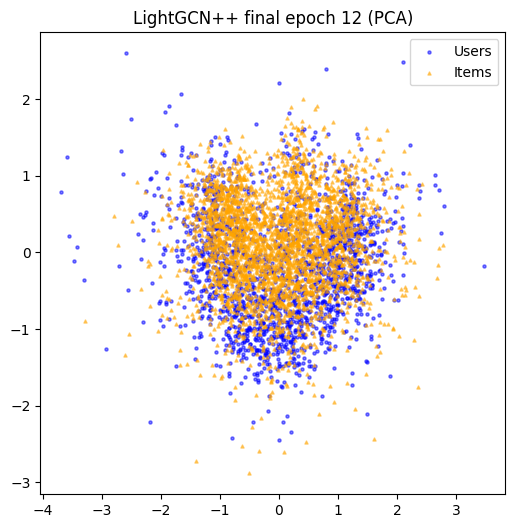

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


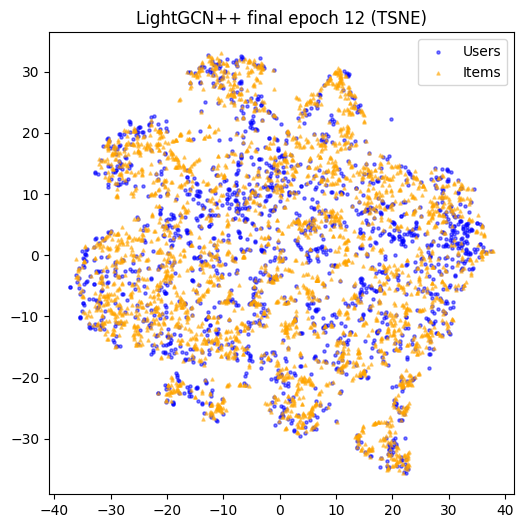

=== Epoch 13 ===


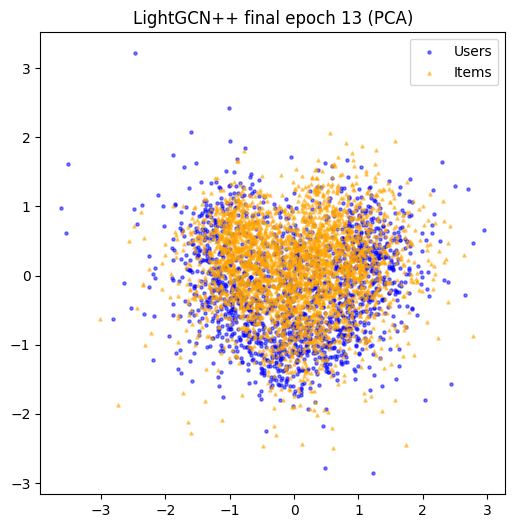

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


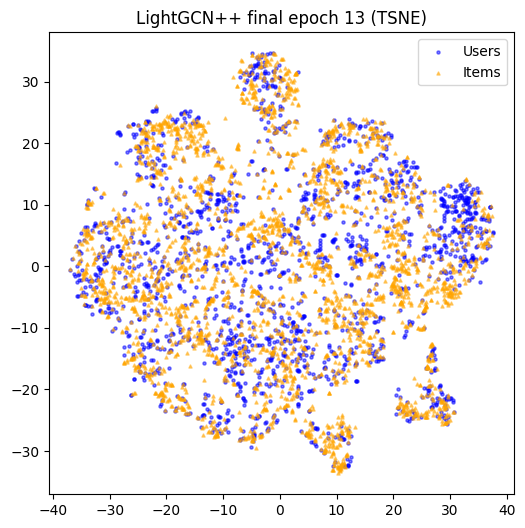

=== Epoch 14 ===


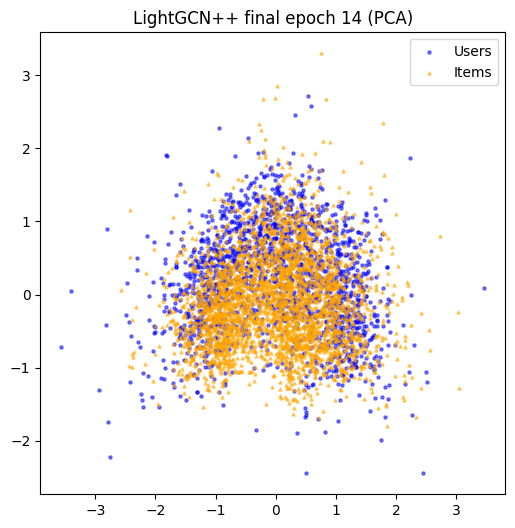

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


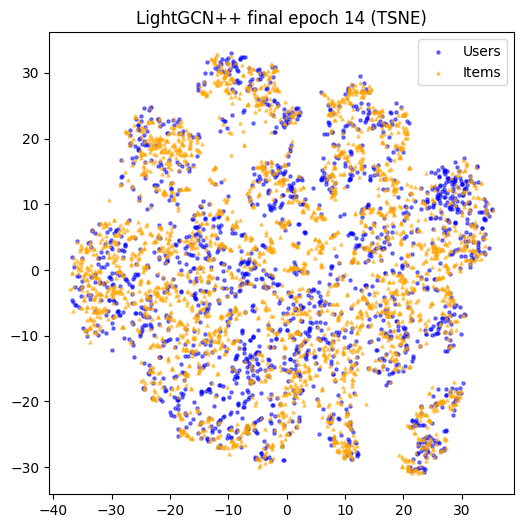

=== Epoch 15 ===


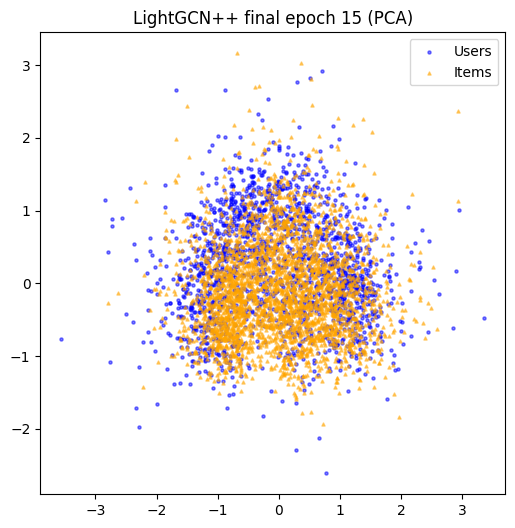

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


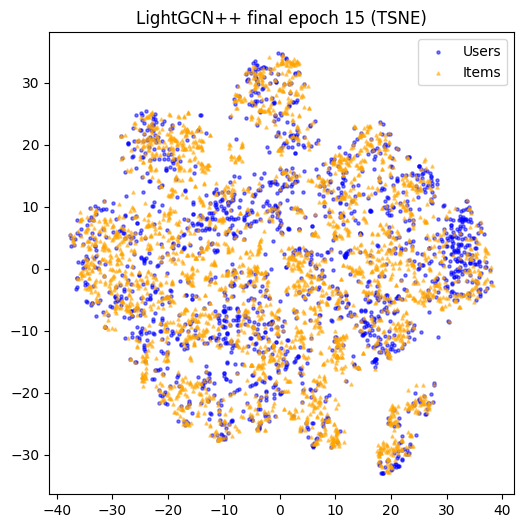

=== Epoch 16 ===


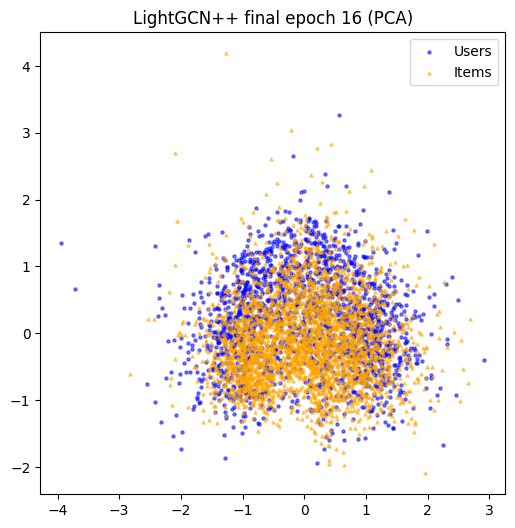

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


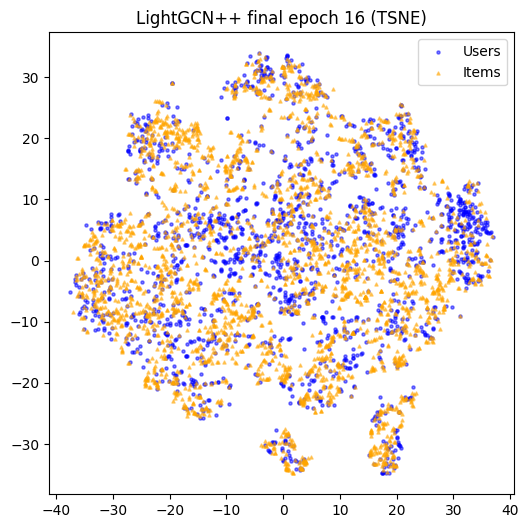

=== Epoch 17 ===


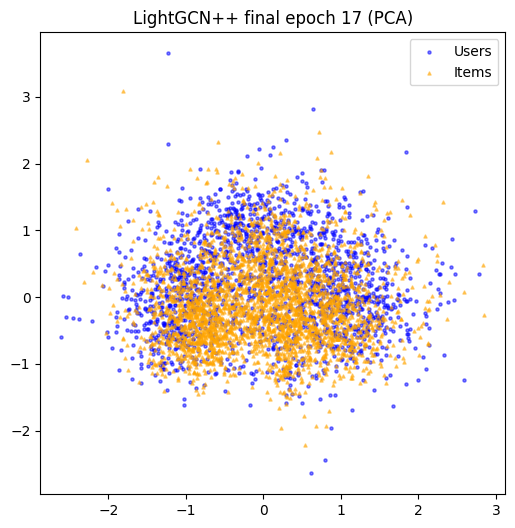

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


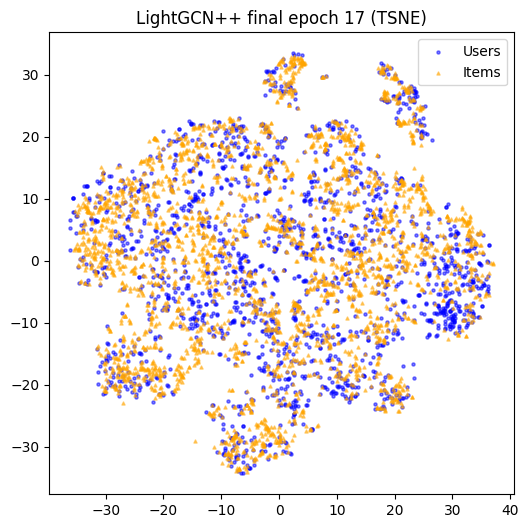

=== Epoch 18 ===


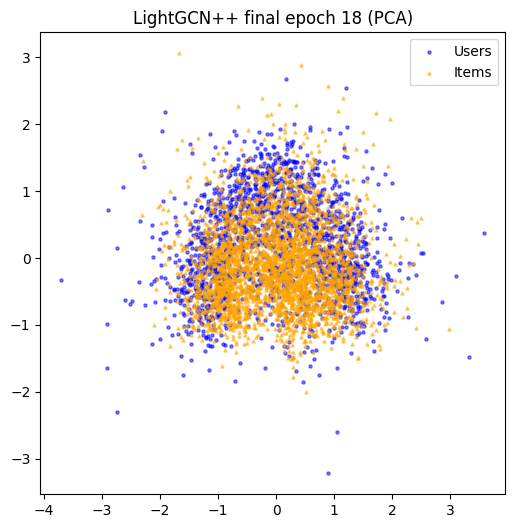

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


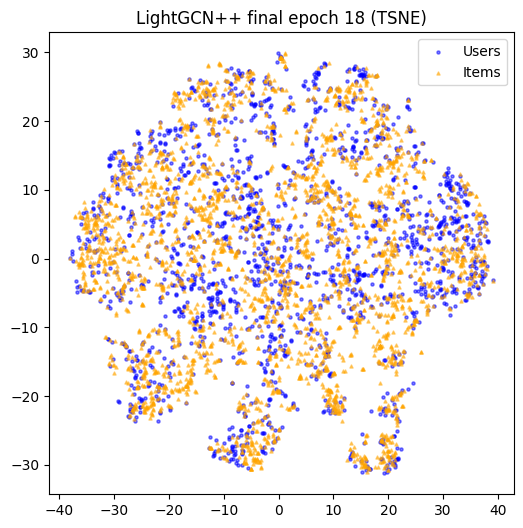

=== Epoch 19 ===


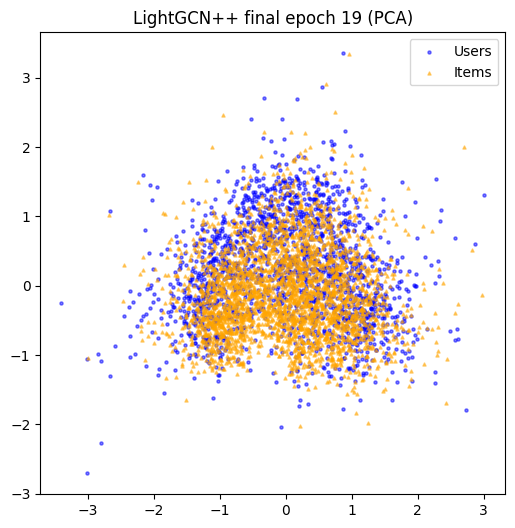

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


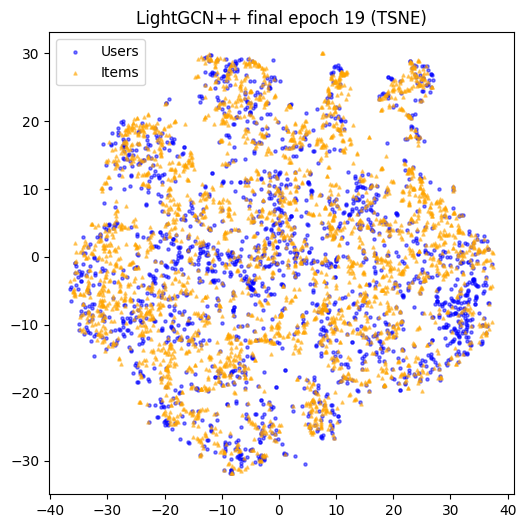

=== Epoch 20 ===


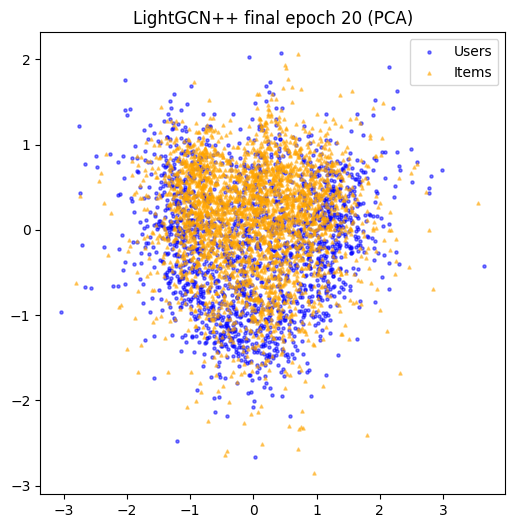

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


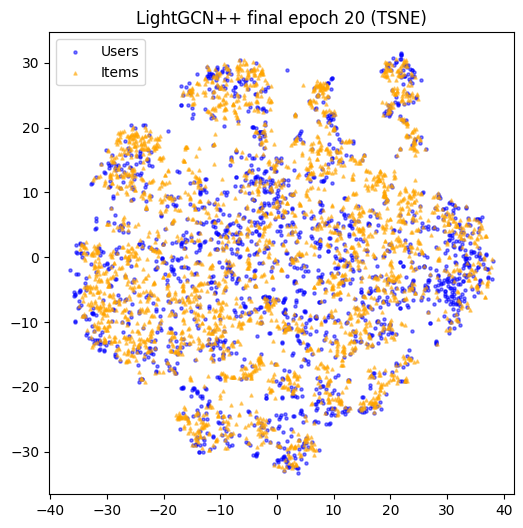

=== Epoch 21 ===


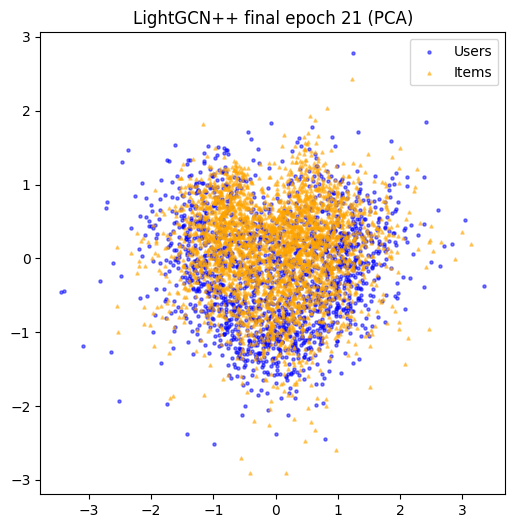

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


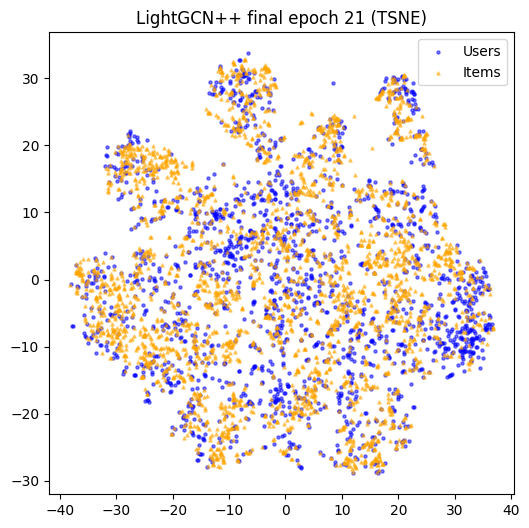

=== Epoch 22 ===


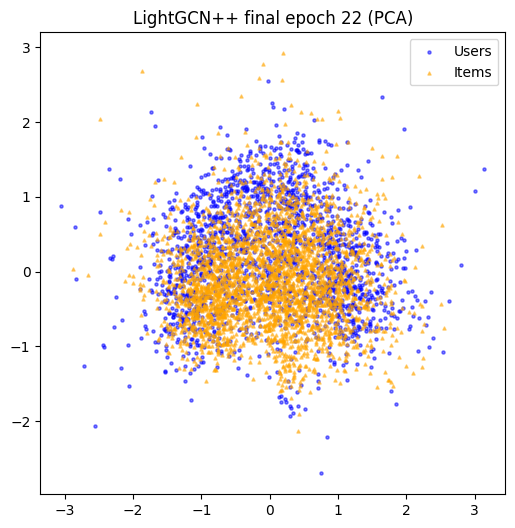

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


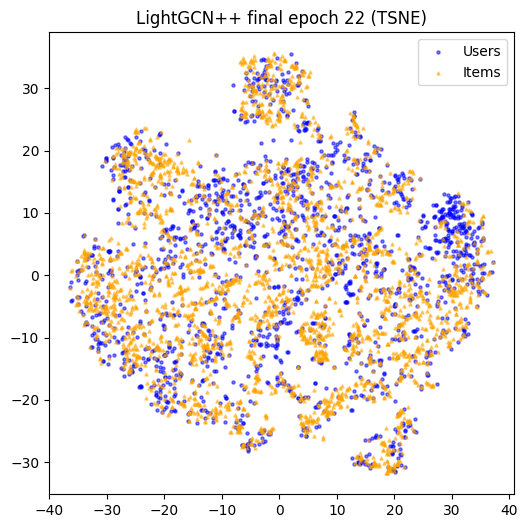

=== Epoch 23 ===


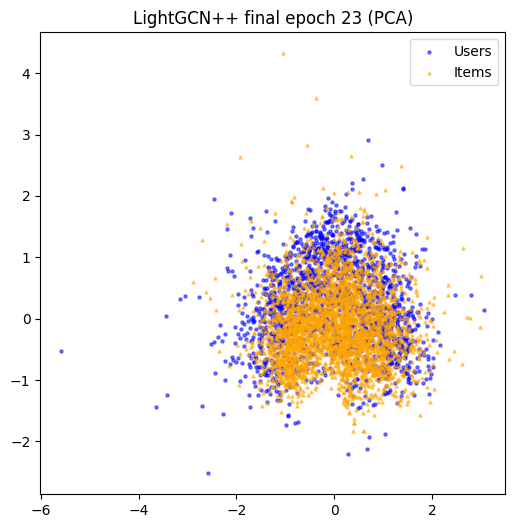

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


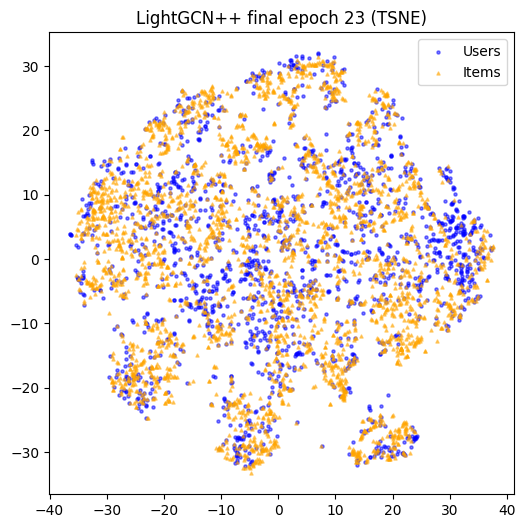

=== Epoch 24 ===


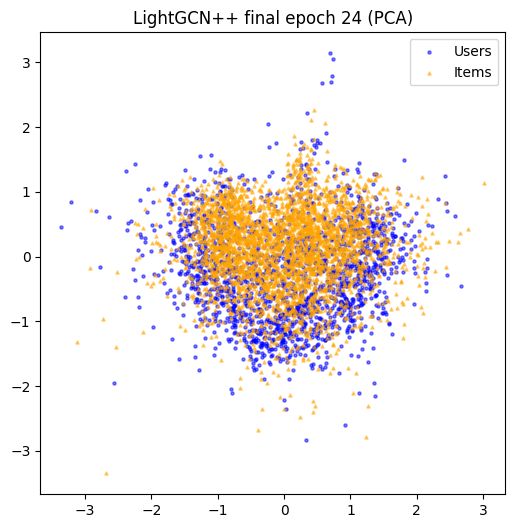

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


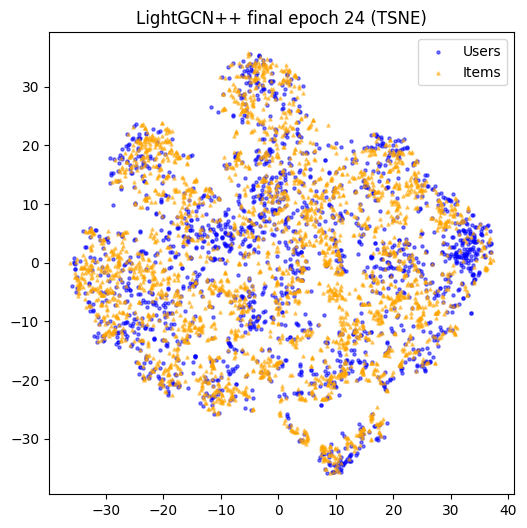

=== Epoch 25 ===


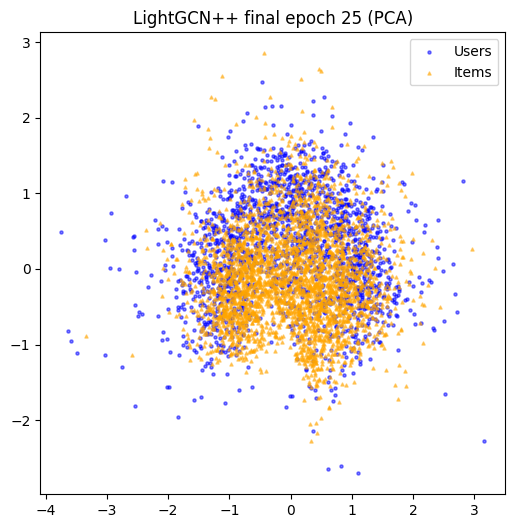

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


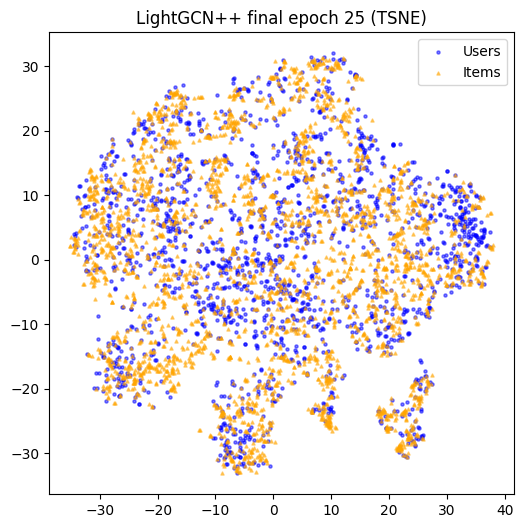

=== Epoch 26 ===


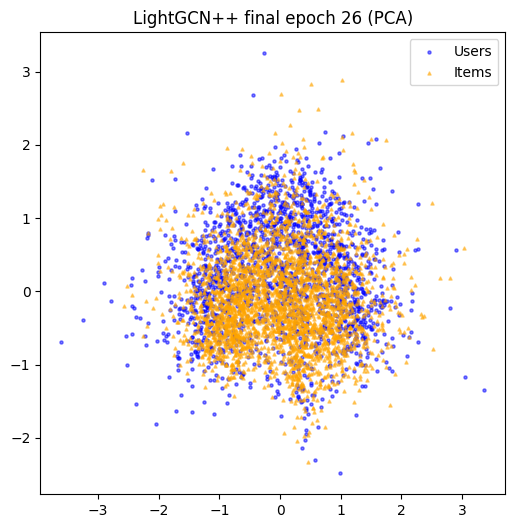

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


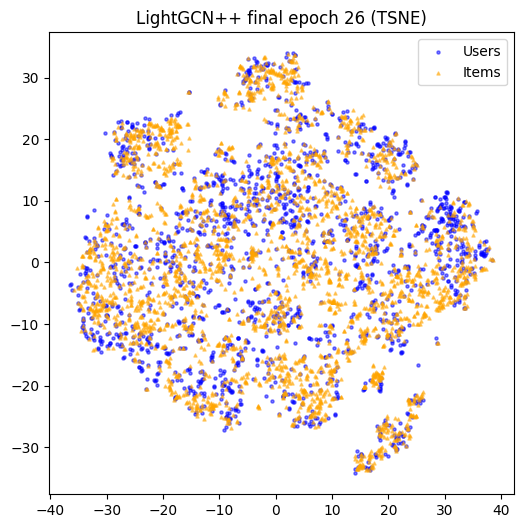

=== Epoch 27 ===


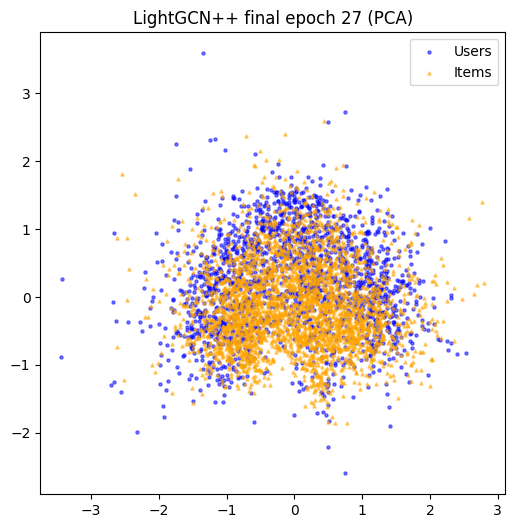

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


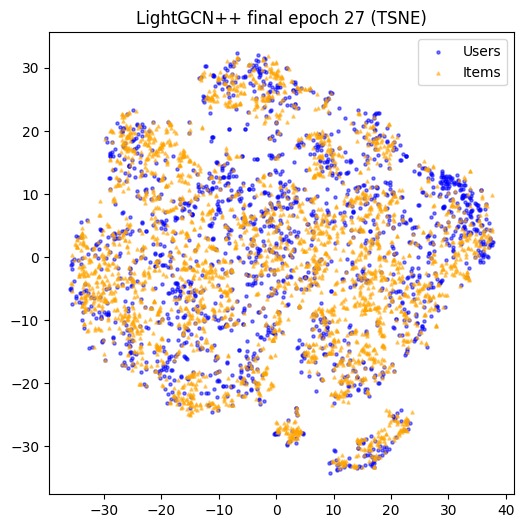

=== Epoch 28 ===


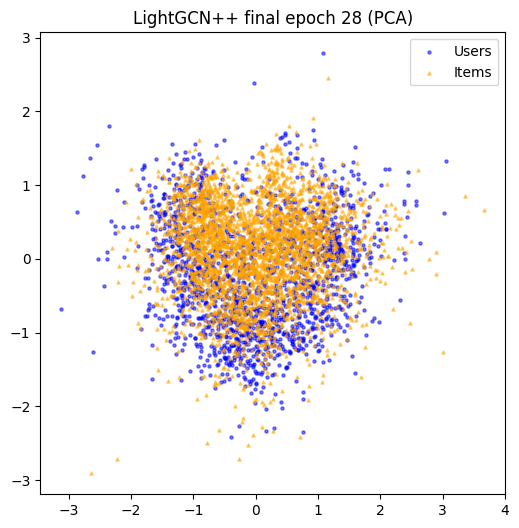

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


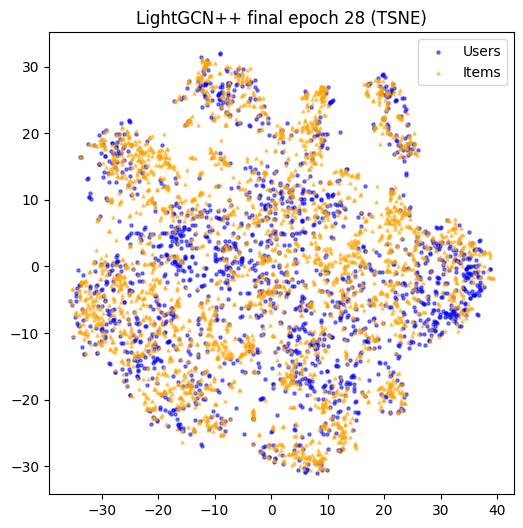

=== Epoch 29 ===


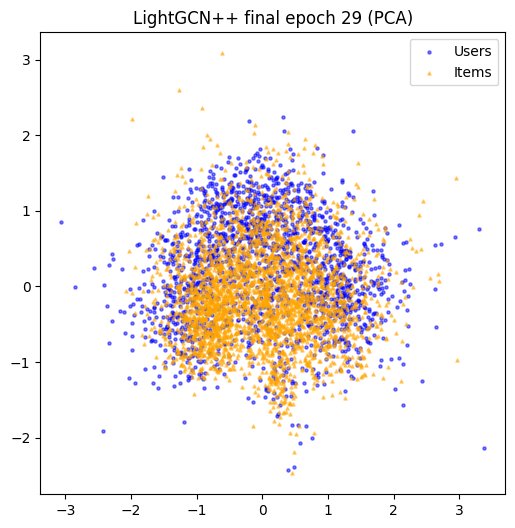

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


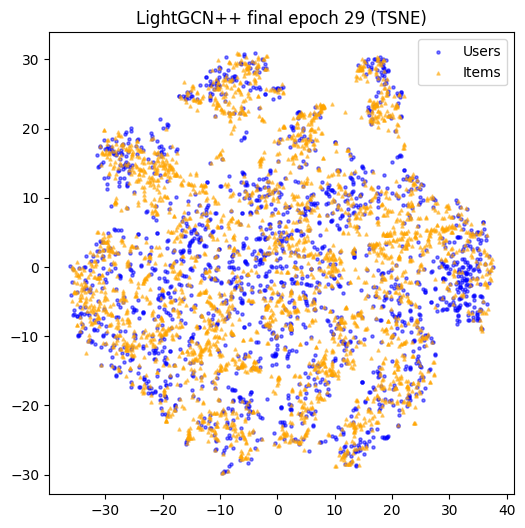

=== Epoch 30 ===


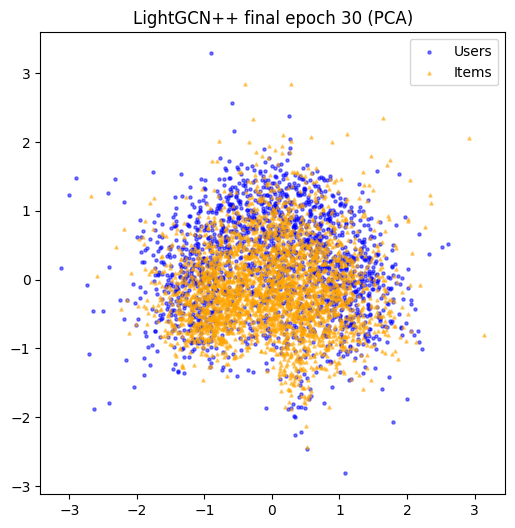

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


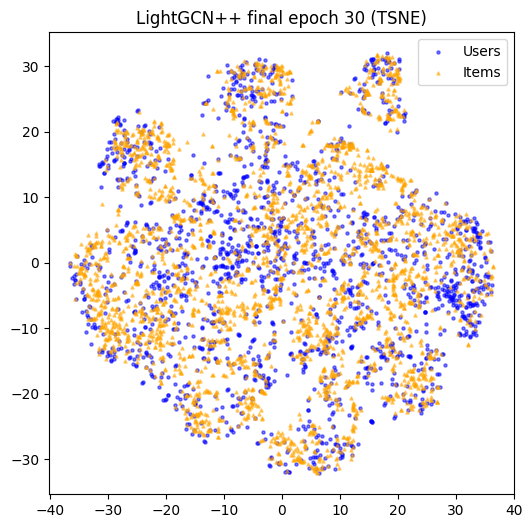

In [16]:
%cd /content/LightGCNpp/code/embeds
# 假设你有 1,2,3,...,N 个 epoch 的文件
import glob, re

# 自动找出所有 epoch 文件（只看 user_final），并排序
files = glob.glob("user_emb_final_epoch*.npy")
epochs = sorted([int(re.search(r'epoch(\d+)', f).group(1)) for f in files])

for e in epochs:
    user_f = f"user_emb_final_epoch{e}.npy"
    item_f = f"item_emb_final_epoch{e}.npy"
    print(f"=== Epoch {e} ===")
    plot_embeddings(user_f, item_f, method="pca", title=f"LightGCN++ final epoch {e}")
    plot_embeddings(user_f, item_f, method="tsne", title=f"LightGCN++ final epoch {e}")

In [17]:
%cd /content/LightGCNpp/code
!echo "===== model.py (1-200) ====="
!sed -n '1,200p' model.py
!echo "===== Procedure.py (1-200) ====="
!sed -n '1,200p' Procedure.py
!echo "===== main.py (1-200) ====="
!sed -n '1,200p' main.py
!echo "===== Procedure.py (结尾 200 行) ====="
!tail -n 200 Procedure.py
!echo "===== main.py (结尾 200 行) ====="
!tail -n 200 main.py

/content/LightGCNpp/code
===== model.py (1-200) =====
import world
try:
    import world_gaudi  # optional Gaudi support
except Exception:
    world_gaudi = None
import torch
from dataloader import BasicDataset
from torch import nn
import numpy as np
import numpy as np


class BasicModel(nn.Module):    
    def __init__(self):
        super(BasicModel, self).__init__()
    
    def getUsersRating(self, users):
        raise NotImplementedError
    
class PairWiseModel(BasicModel):
    def __init__(self):
        super(PairWiseModel, self).__init__()
    def bpr_loss(self, users, pos, neg):
        """
        Parameters:
            users: users list 
            pos: positive items for corresponding users
            neg: negative items for corresponding users
        Return:
            (log-loss, l2-loss)
        """
        raise NotImplementedError
    
class PureMF(BasicModel):
    def __init__(self, 
                 config:dict, 
                 dataset:BasicDataset):
        

In [18]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [19]:
import shutil

# 创建目录
save_dir = "/content/drive/My Drive/LightGCN/embeddings"
import os; os.makedirs(save_dir, exist_ok=True)
%cd /content/LightGCNpp/code/embeds
# 复制文件
shutil.copy("/content/LightGCNpp/code/embeds/user_emb_final_epoch30.npy", save_dir)
shutil.copy("/content/LightGCNpp/code/embeds/item_emb_final_epoch30.npy", save_dir)

print(f"✅ Saved embeddings to {save_dir}")

/content/LightGCNpp/code/embeds
✅ Saved embeddings to /content/drive/My Drive/LightGCN/embeddings


## UMAP

/usr/local/lib/python3.12/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


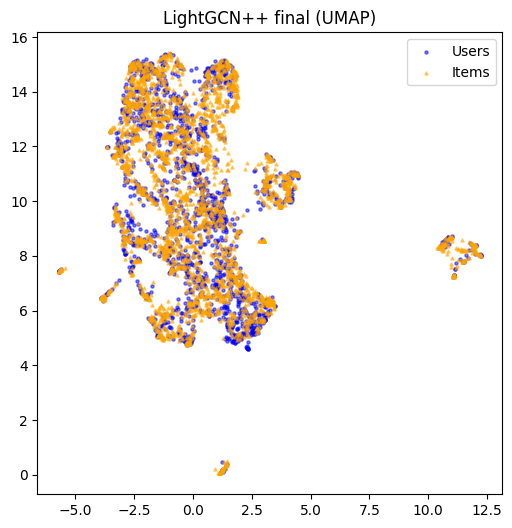

In [25]:
!pip install umap-learn
import umap

def plot_umap(user_file, item_file, title="", sample_size=5000):
    u = np.load(user_file)
    i = np.load(item_file)
    X = np.vstack([u, i])
    labels = np.array([0]*len(u) + [1]*len(i))
    if len(X) > sample_size:
        idx = np.random.choice(len(X), sample_size, replace=False)
        X, labels = X[idx], labels[idx]
    Z = umap.UMAP(n_components=2, random_state=42).fit_transform(X)
    plt.figure(figsize=(6,6))
    plt.scatter(Z[labels==0,0], Z[labels==0,1], s=5, c="blue", alpha=0.5, label="Users")
    plt.scatter(Z[labels==1,0], Z[labels==1,1], s=5, c="orange", alpha=0.5, marker="^", label="Items")
    plt.title(title + " (UMAP)")
    plt.legend(); plt.show()


plot_umap("user_emb_final_epoch30.npy", "item_emb_final_epoch30.npy", title="LightGCN++ final")


## Heatmap

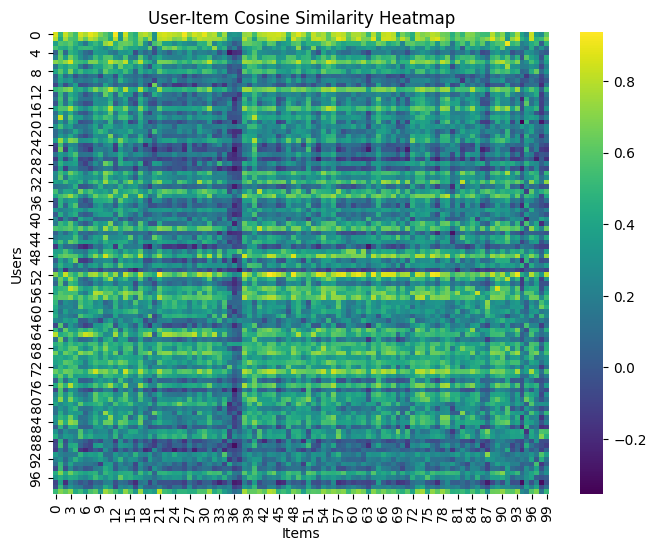

In [24]:
from sklearn.metrics.pairwise import cosine_similarity
import seaborn as sns

def plot_heatmap(user_file, item_file, sample_users=100, sample_items=100):
    u = np.load(user_file)[:sample_users]
    i = np.load(item_file)[:sample_items]
    sim = cosine_similarity(u, i)
    plt.figure(figsize=(8,6))
    sns.heatmap(sim, cmap="viridis")
    plt.title("User-Item Cosine Similarity Heatmap")
    plt.xlabel("Items"); plt.ylabel("Users")
    plt.show()

plot_heatmap("user_emb_final_epoch30.npy", "item_emb_final_epoch30.npy")

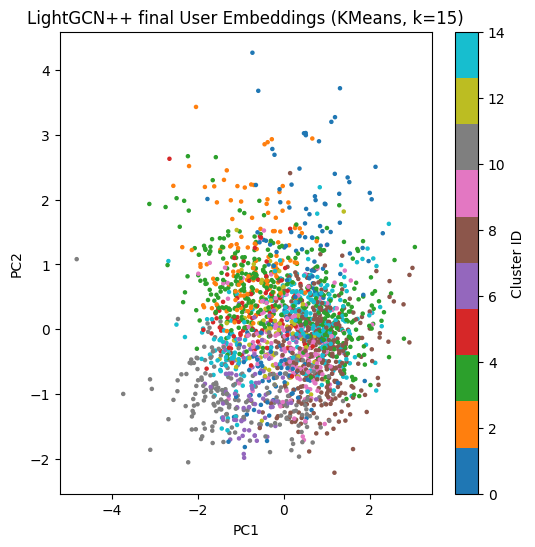

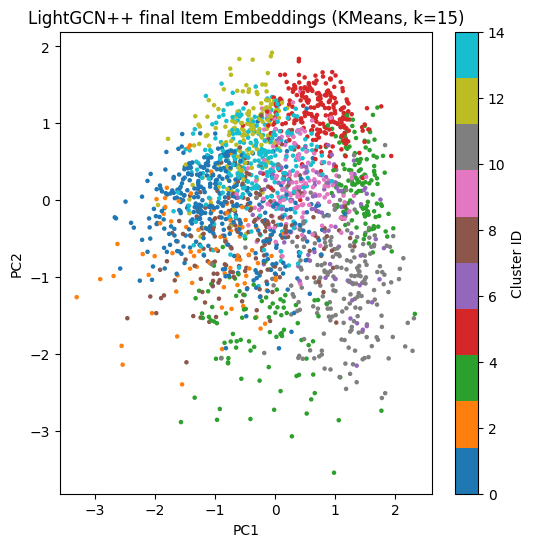

In [31]:
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import numpy as np

def plot_kmeans(user_file, item_file, target="user", k=15, sample_size=2000, title=""):
    u = np.load(user_file)
    i = np.load(item_file)
    if target=="user":
        X = u[:sample_size]
        label_type = "User"
    else:
        X = i[:sample_size]
        label_type = "Item"

    # Dimension Reduction to 2D
    Z = PCA(n_components=2).fit_transform(X)

    # KMeans
    km = KMeans(n_clusters=k, random_state=42)
    clusters = km.fit_predict(X)

    # plot
    plt.figure(figsize=(6,6))
    plt.scatter(Z[:,0], Z[:,1], c=clusters, cmap="tab10", s=5)
    plt.title(f"{title} {label_type} Embeddings (KMeans, k={k})")
    plt.xlabel("PC1"); plt.ylabel("PC2")
    plt.colorbar(label="Cluster ID")
    plt.show()

plot_kmeans("user_emb_final_epoch30.npy", "item_emb_final_epoch30.npy", target="user", k=15, title="LightGCN++ final")
plot_kmeans("user_emb_final_epoch30.npy", "item_emb_final_epoch30.npy", target="item", k=15, title="LightGCN++ final")

In [34]:
# ===== t-SNE 动画：LightGCN embeddings over epochs =====
import os, re, glob
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, FFMpegWriter, PillowWriter
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE

# ---------- 配置 ----------
EMB_DIR = "/content/LightGCNpp/code/embeds"   # 你的 .npy 存放目录
USER_PAT = "user_emb_final_epoch*.npy"        # 也可改成 user_emb_layer{L}_epoch*.npy
ITEM_PAT = "item_emb_final_epoch*.npy"        # 也可改成 item_emb_layer{L}_epoch*.npy
sample_users = 4000
sample_items = 4000
perplexity = 30
first_iter = 1000
later_iter = 300
metric = "cosine"      # 余弦距离通常更适合 embedding
use_gif = False        # True: GIF；False: MP4(推荐)
fps = 6
dpi = 160
outfile = os.path.join(EMB_DIR, "tsne_anim.mp4" if not use_gif else "tsne_anim.gif")

# ---------- 收集 epoch 文件 ----------
fu_all = glob.glob(os.path.join(EMB_DIR, USER_PAT))
fi_all = glob.glob(os.path.join(EMB_DIR, ITEM_PAT))
get_e = lambda s: int(re.search(r'epoch(\d+)', os.path.basename(s)).group(1))
eu = {get_e(f) for f in fu_all}
ei = {get_e(f) for f in fi_all}
epochs = sorted(eu & ei)
assert epochs, "没有找到匹配的 user/item epoch 文件"

fu = [os.path.join(EMB_DIR, f"user_emb_final_epoch{e}.npy") for e in epochs]
fi = [os.path.join(EMB_DIR, f"item_emb_final_epoch{e}.npy") for e in epochs]

# ---------- 固定采样索引（避免帧间采样抖动） ----------
u0 = np.load(fu[0]); i0 = np.load(fi[0])
nu, ni = len(u0), len(i0)
idx_u = np.random.choice(nu, min(sample_users, nu), replace=False)
idx_i = np.random.choice(ni, min(sample_items, ni), replace=False)

# ---------- 同一 PCA 基到 50 维 ----------
pca50 = PCA(n_components=50, random_state=42).fit(
    np.vstack([u0[idx_u], i0[idx_i]])
)

def load_frame_xy(k):
    u = np.load(fu[k])[idx_u]
    i = np.load(fi[k])[idx_i]
    X = np.vstack([u, i])
    lab = np.array([0]*len(u) + [1]*len(i))  # 0=user, 1=item
    X50 = pca50.transform(X)
    return X50, lab

# ---------- 逐帧 t-SNE（首帧正常，后续 warm-start） ----------
layouts = []
labels = None
Z_prev = None
for k in range(len(epochs)):
    X50, lab = load_frame_xy(k)
    if labels is None: labels = lab
    tsne = TSNE(
    n_components=2,
    perplexity=perplexity,
    metric=metric,
    init=("pca" if Z_prev is None else Z_prev),
    learning_rate="auto",
    n_iter=(first_iter if Z_prev is None else later_iter),
    early_exaggeration=(12.0 if Z_prev is None else 1.0),  # ✅ 改成1.0而不是0.0
    method="barnes_hut",
    random_state=42,
    verbose=1 if k==0 else 0
)
    Z = tsne.fit_transform(X50)   # 若 warm-start，用上一帧 Z_prev 作为 init
    layouts.append(Z)
    Z_prev = Z

# ---------- 固定坐标轴范围 ----------
mins = np.vstack([Z.min(axis=0) for Z in layouts]).min(axis=0)
maxs = np.vstack([Z.max(axis=0) for Z in layouts]).max(axis=0)
pad = 0.05 * (maxs - mins)
xlim = (mins[0]-pad[0], maxs[0]+pad[0])
ylim = (mins[1]-pad[1], maxs[1]+pad[1])

# ---------- 动画 ----------
fig, ax = plt.subplots(figsize=(6,6), dpi=dpi)
sc_u = ax.scatter([], [], s=5, alpha=0.5, marker='o', label="Users")
sc_i = ax.scatter([], [], s=5, alpha=0.5, marker='^', label="Items")
txt = ax.text(0.02, 0.98, "", transform=ax.transAxes, va="top", ha="left")
ax.set_xlim(*xlim); ax.set_ylim(*ylim)
ax.set_title("t-SNE of LightGCN Embeddings (Users & Items)")
ax.legend(loc="lower right")

def init():
    sc_u.set_offsets(np.empty((0,2)))
    sc_i.set_offsets(np.empty((0,2)))
    txt.set_text("")
    return sc_u, sc_i, txt

def update(frame):
    Z = layouts[frame]
    sc_u.set_offsets(Z[labels==0])
    sc_i.set_offsets(Z[labels==1])
    e = epochs[frame]
    txt.set_text(f"Epoch {e}  |  users: {np.sum(labels==0)}  items: {np.sum(labels==1)}")
    return sc_u, sc_i, txt

anim = FuncAnimation(fig, update, init_func=init, frames=len(epochs), blit=False, interval=1000/fps)

# 保存
if use_gif:
    writer = PillowWriter(fps=fps)
else:
    writer = FFMpegWriter(fps=fps, bitrate=2400)
anim.save(outfile, writer=writer)
plt.close(fig)
print("Saved to:", outfile)

/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 8000 samples in 0.001s...
[t-SNE] Computed neighbors for 8000 samples in 0.839s...
[t-SNE] Computed conditional probabilities for sample 1000 / 8000
[t-SNE] Computed conditional probabilities for sample 2000 / 8000
[t-SNE] Computed conditional probabilities for sample 3000 / 8000
[t-SNE] Computed conditional probabilities for sample 4000 / 8000
[t-SNE] Computed conditional probabilities for sample 5000 / 8000
[t-SNE] Computed conditional probabilities for sample 6000 / 8000
[t-SNE] Computed conditional probabilities for sample 7000 / 8000
[t-SNE] Computed conditional probabilities for sample 8000 / 8000
[t-SNE] Mean sigma: 0.077215
[t-SNE] KL divergence after 250 iterations with early exaggeration: 82.226395
[t-SNE] KL divergence after 1000 iterations: 1.617867


/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/manifold/_t_sne.py:1164: FutureWarnin

KeyboardInterrupt: 